# Imports

In [56]:
from matplotlib import pyplot as plt
import argparse
import cv2
import numpy as np
from skimage.io import imread, imshow
from skimage.color import rgb2gray
from scipy import signal
import pywt
import skimage
from scipy.fftpack import fft2, ifft2
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim



In [19]:
def plt_imshow(title, image):
	image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
	plt.imshow(image)
	plt.title(title)
	plt.grid(False)
	plt.show()

# 1. Edge Detection
In an edge detection algorithm, one common approach is to initially perform Gaussian smoothing on the image
and subsequently apply the Laplacian filter. If we reverse this order and first apply Gaussian smoothing followed
by the Laplacian filter, what distinctions emerge between the two approaches?

## Gaussian Then Laplacian

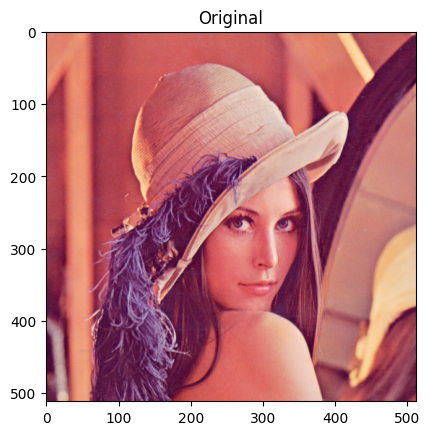

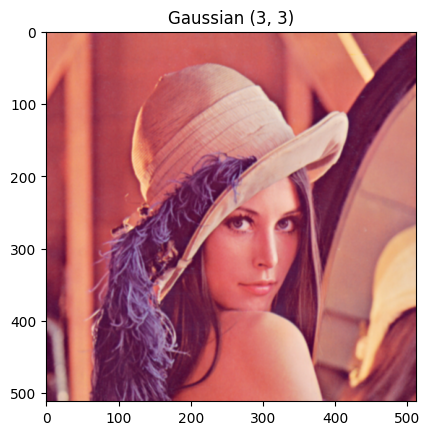

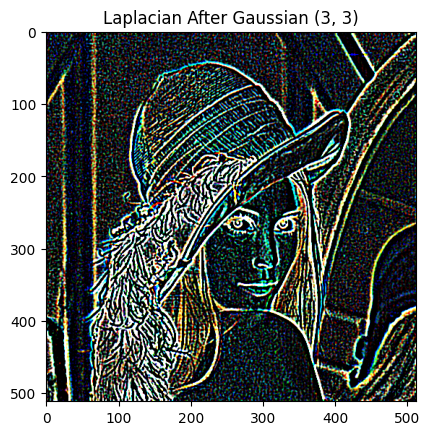

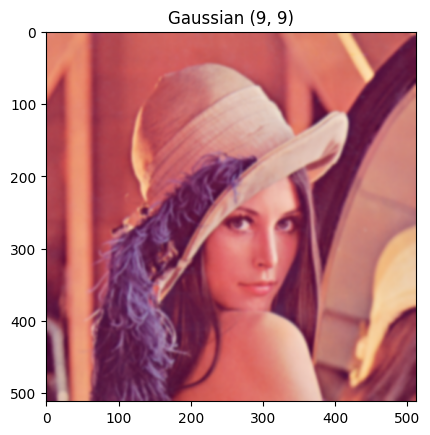

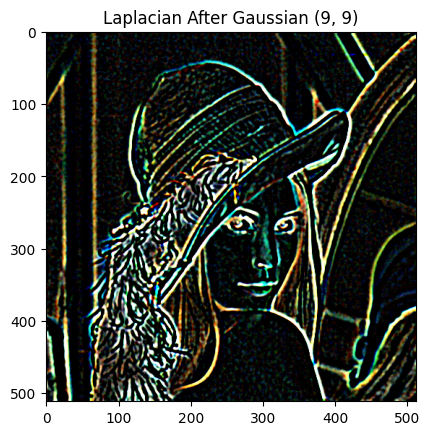

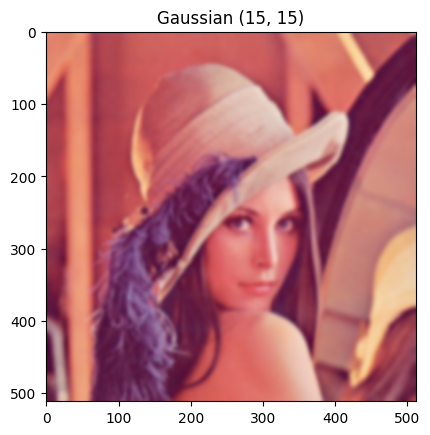

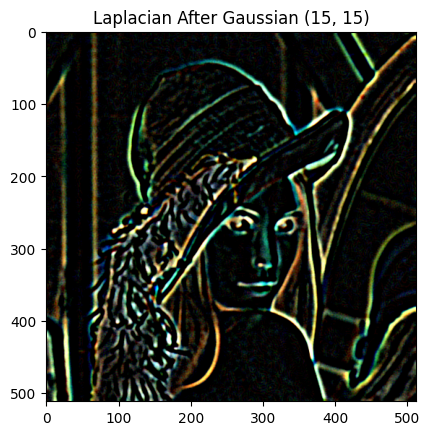

In [ ]:
image = cv2.imread("/content/drive/MyDrive/Lenna_(test_image).png")
plt_imshow("Original", image)
kernelSizes = [(3, 3), (9, 9), (15, 15)]
for (kX, kY) in kernelSizes:
  blurred = cv2.GaussianBlur(image, (kX, kY), 0)
  edges = cv2.Laplacian(blurred, -1, ksize=5, scale=1,delta=0,borderType=cv2.BORDER_DEFAULT)
  plt_imshow("Gaussian ({}, {})".format(kX, kY), blurred)
  plt_imshow("Laplacian After Gaussian ({}, {})".format(kX, kY), edges)

## Laplacian Then Gaussian

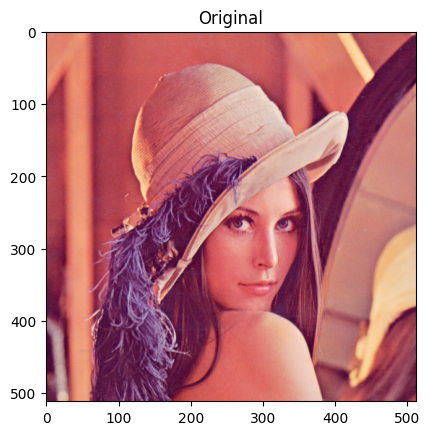

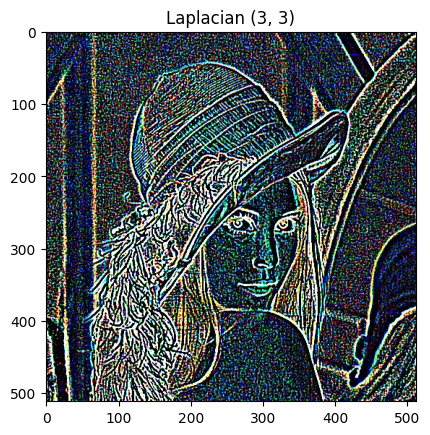

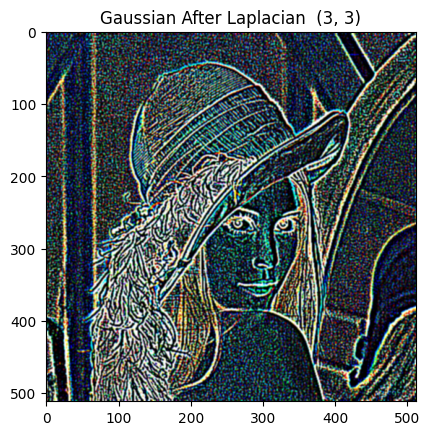

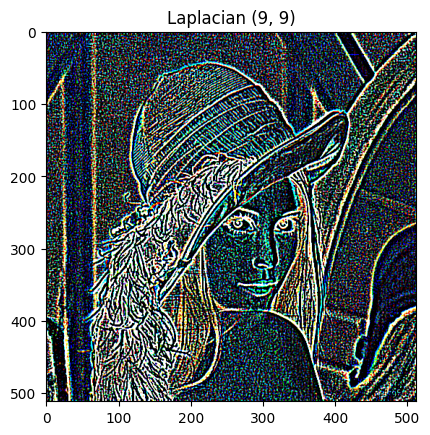

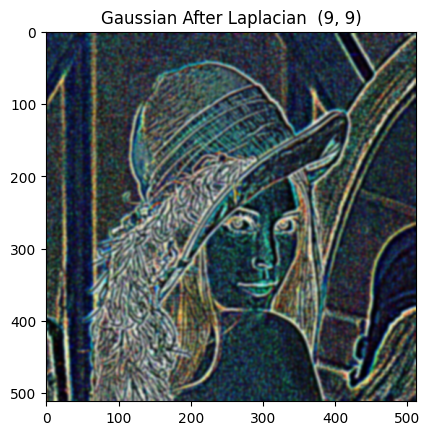

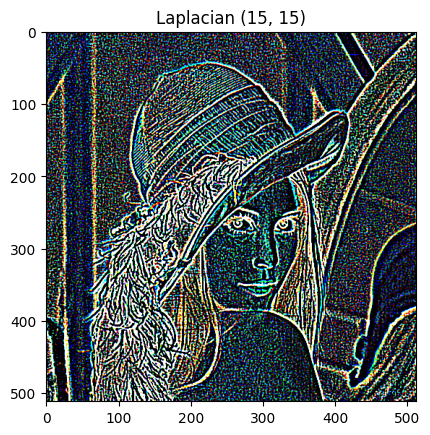

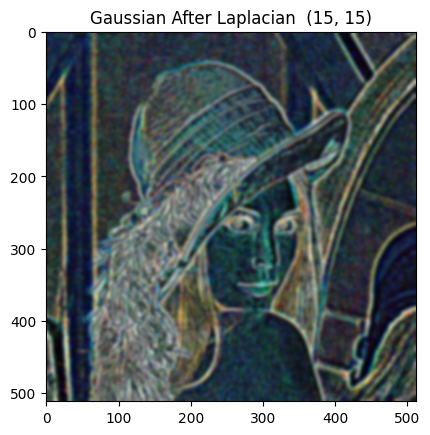

In [ ]:
image = cv2.imread("/content/drive/MyDrive/Lenna_(test_image).png")
plt_imshow("Original", image)
kernelSizes = [(3, 3), (9, 9), (15, 15)]

for (kX, kY) in kernelSizes:
  edges = cv2.Laplacian(image, -1, ksize=5, scale=1,delta=0,borderType=cv2.BORDER_DEFAULT)
  blurred = cv2.GaussianBlur(edges, (kX, kY), 0)

  plt_imshow("Laplacian ({}, {})".format(kX, kY), edges)
  plt_imshow("Gaussian After Laplacian  ({}, {})".format(kX, kY), blurred)

# 2. Down Sample and Up Sample Image
 Write a program which can, firstly, down sample an image by a factor of 2, with and without using the averaging
filter, and also, up-sample the previously down sampled images by a factor of 2, using the pixel replication and
bilinear interpolation methods, respectively. (Lena image)

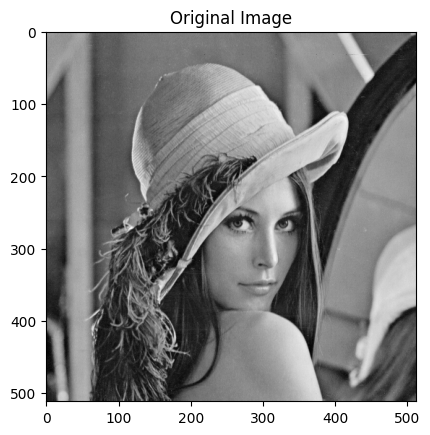

(512, 512)


<Figure size 640x480 with 0 Axes>

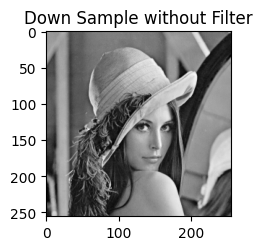

(256, 256)


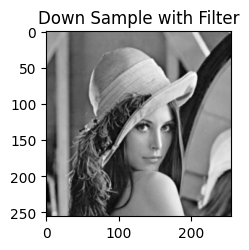

(256, 256)


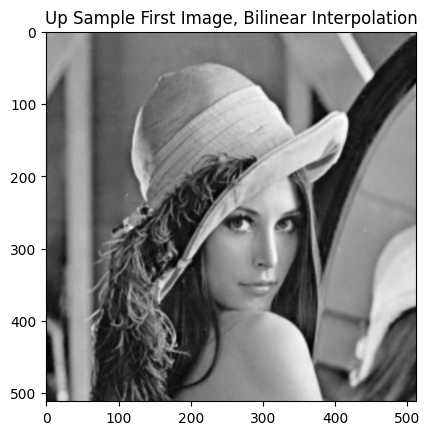

(512, 512)


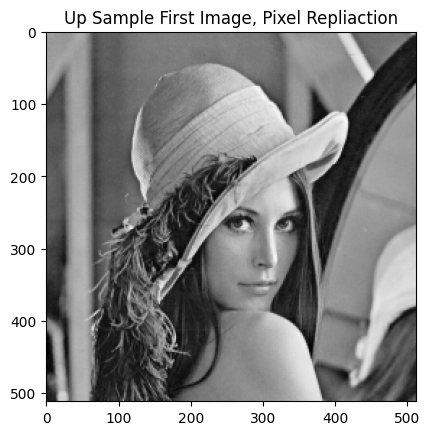

(512, 512)


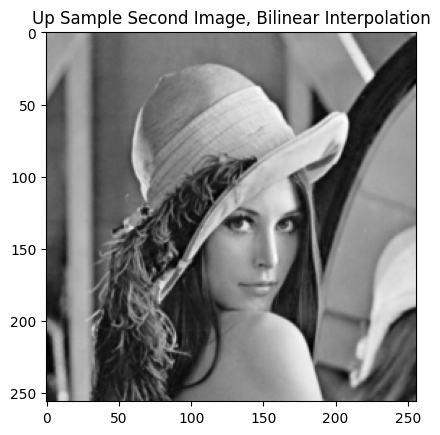

(512, 512)


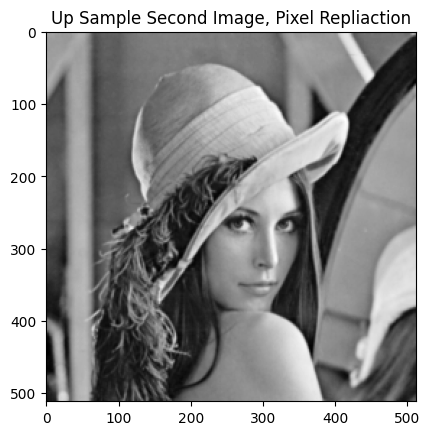

(512, 512)


In [33]:
image = cv2.imread("/content/drive/MyDrive/Lenna_(test_image).png")
image = np.mean(image, axis=2)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.grid(False)
plt.show()
fh, fw = plt.figure().get_size_inches()
print(image.shape)
h, w = image.shape[:2]

# Down sample image without using average filter
downsampled_without_filter = cv2.resize(image, (w // 2, h // 2))
plt.figure(figsize=(fh/2, fw/2))
plt.imshow(downsampled_without_filter, cmap='gray')
plt.title('Down Sample without Filter')
plt.grid(False)
plt.show()
print(downsampled_without_filter.shape)

# Down sample image by using average filter
downsampled_avg_filter = cv2.pyrDown(image, (w // 2, h // 2))
plt.figure(figsize=(fh/2, fw/2))
plt.imshow(downsampled_avg_filter, cmap='gray')
plt.title('Down Sample with Filter')
plt.grid(False)
plt.show()
print(downsampled_avg_filter.shape)

# Up sample  the first down_sampled image using Bilinear Interpolation
uimage  = cv2.resize(downsampled_without_filter, (w , h), interpolation=cv2.INTER_LINEAR)
plt.figure(figsize=(fh, fw))
plt.imshow(uimage, cmap='gray')
plt.title('Up Sample First Image, Bilinear Interpolation')
plt.grid(False)
plt.show()
print(uimage.shape)

# Up sample  the first down_sampled image using Pixel Replication
upsampled_image = np.zeros((downsampled_without_filter.shape[0] * 2, downsampled_without_filter.shape[1] * 2), dtype=np.uint8)
for x in range(downsampled_without_filter.shape[0]):
    for y in range(downsampled_without_filter.shape[1]):
        for i in range(2):
            for j in range(2):
                upsampled_image[x * 2 + i, y * 2 + j] = downsampled_without_filter[x, y]
plt.figure(figsize=(fh, fw))
plt.imshow(upsampled_image, cmap='gray')
plt.title('Up Sample First Image, Pixel Repliaction')
plt.grid(False)
plt.show()
print(upsampled_image.shape)

# Up sample the second down_sampled image using Bilinear Interpolation
uimage  = cv2.resize(downsampled_avg_filter, (w , h), interpolation=cv2.INTER_LINEAR)
plt.figure(figsize=(fh, fw))
plt.imshow(downsampled_avg_filter, cmap='gray')
plt.title('Up Sample Second Image, Bilinear Interpolation')
plt.grid(False)
plt.show()
print(uimage.shape)

upsampled_image = np.zeros((downsampled_avg_filter.shape[0] * 2, downsampled_avg_filter.shape[1] * 2), dtype=np.uint8)

# Up sample the second down_sampled image using Pixel Replication
for x in range(downsampled_avg_filter.shape[0]):
    for y in range(downsampled_avg_filter.shape[1]):
        for i in range(2):
            for j in range(2):
                upsampled_image[x * 2 + i, y * 2 + j] = downsampled_avg_filter[x, y]
plt.figure(figsize=(fh, fw))
plt.imshow(upsampled_image, cmap='gray')
plt.title('Up Sample Second Image, Pixel Repliaction')
plt.grid(False)
plt.show()
print(upsampled_image.shape)

# 3. Compare the Filters in both the Frequency and the Spatial Domain


In [83]:
def convolve_fft(image, filter):
    # Convert image and filter to Fourier domain
    F_image = fft2(image)
    F_filter = fft2(filter)

    # Multiply the padded filter with the image's Fourier transform
    F_filtered = F_image * F_filter

    # Apply inverse Fourier transform
    filtered_image = ifft2(F_filtered)
    filtered_image = np.fft.ifftshift(filtered_image)
    # Return filtered image
    abs_F_filtered = np.abs(filtered_image)

    # Return absolute values of filtered image
    return abs_F_filtered

 ## A) Kernel: [[1/9, 1/9, 1/9], [1/9, 1/9, 1/9], [1/9, 1/9, 1/9]]







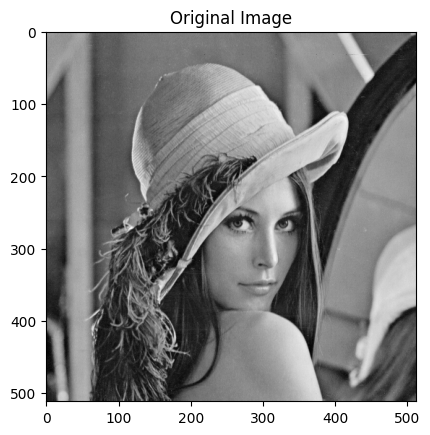

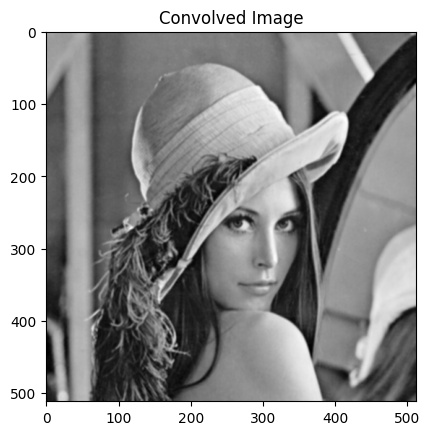

SSIM for Convolution: 0.7115705909351975


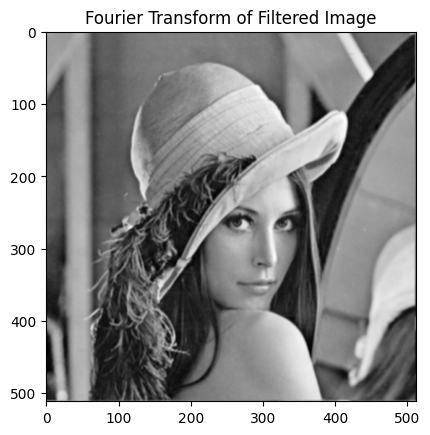

SSIM for Fourier transform: 0.57120482781587


In [84]:
image = cv2.imread("/content/drive/MyDrive/Lenna_(test_image).png")
image = np.mean(image, axis=2)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.grid(False)
plt.show()

kernel = np.ones((3, 3), dtype=np.float32)
kernel /= 9
resized_kernel = np.zeros((512, 512), dtype=np.float32)
# Copy the original kernel into the center of the new kernel
resized_kernel[(512 - 3) // 2:(512 + 3) // 2,
           (512 - 3) // 2:(512 + 3) // 2] = kernel


# Convolution
dst = cv2.filter2D(image, -1, kernel)
dst = np.abs(dst)
plt.imshow(dst, cmap='gray')
plt.title('Convolved Image')
plt.grid(False)
plt.show()
print("SSIM for Convolution:", ssim(image, dst))
#Fourier transform
f_image = convolve_fft(image, resized_kernel)
plt.imshow(f_image, cmap='gray')
plt.title('Fourier Transform of Filtered Image')
plt.grid(False)
plt.show()
print("SSIM for Fourier transform:", ssim(image, f_image))


## B) Kernel: [[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]]

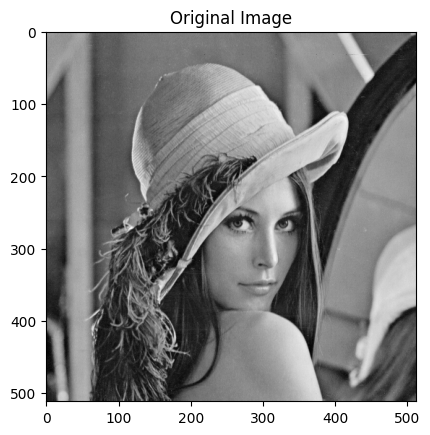

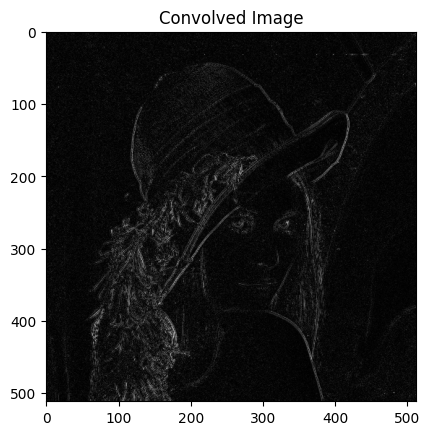

SSIM for Convolution: 0.023816971858887162


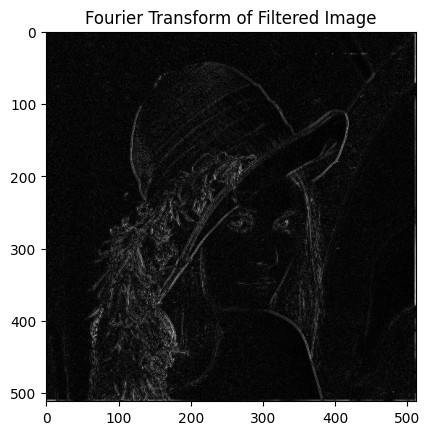

SSIM for Fourier transform: 0.014795666974535037


In [85]:
image = cv2.imread("/content/drive/MyDrive/Lenna_(test_image).png")
image = np.mean(image, axis=2)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.grid(False)
plt.show()

kernel_size = 3
kernel = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])
resized_kernel = np.zeros((512, 512), dtype=np.float32)
# Copy the original kernel into the center of the new kernel
resized_kernel[(512 - 3) // 2:(512 + 3) // 2,
           (512 - 3) // 2:(512 + 3) // 2] = kernel


# Convolution
dst = cv2.filter2D(image, -1, kernel)
dst = np.abs(dst)
plt.imshow(dst, cmap='gray')
plt.title('Convolved Image')
plt.grid(False)
plt.show()
print("SSIM for Convolution:", ssim(image, dst))



#Fourier transform
f_image = convolve_fft(image, resized_kernel)
plt.imshow(f_image, cmap='gray')
plt.title('Fourier Transform of Filtered Image')
plt.grid(False)
plt.show()
print("SSIM for Fourier transform:", ssim(image, f_image))

## C) Kernel: [[0, -1, 0], [-1, 5, -1], [0, -1, 0]]

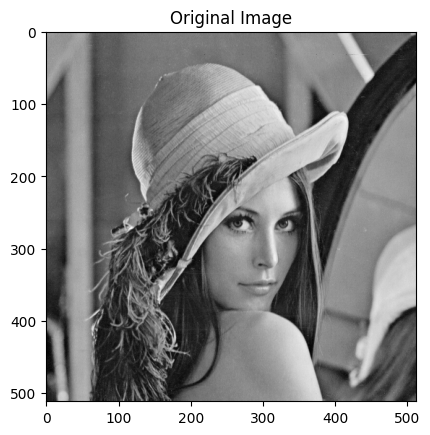

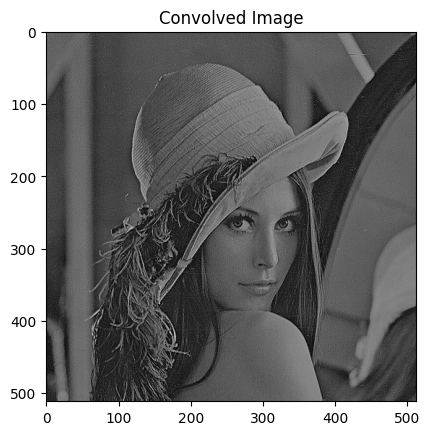

SSIM for Convolution: 0.5161679904901822


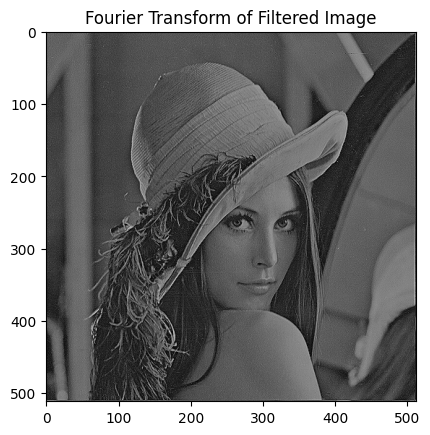

SSIM for Fourier transform: 0.16938147848639484


In [88]:
image = cv2.imread("/content/drive/MyDrive/Lenna_(test_image).png")
image = np.mean(image, axis=2)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.grid(False)
plt.show()

kernel_size = 3
kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
resized_kernel = np.zeros((512, 512), dtype=np.float32)
# Copy the original kernel into the center of the new kernel
resized_kernel[(512 - 3) // 2:(512 + 3) // 2,
           (512 - 3) // 2:(512 + 3) // 2] = kernel


# Convolution
dst = cv2.filter2D(image, -1, kernel)
dst = np.abs(dst)
plt.imshow(dst, cmap='gray')
plt.title('Convolved Image')
plt.grid(False)
plt.show()
print("SSIM for Convolution:", ssim(image, dst))




#Fourier transform
f_image = convolve_fft(image, resized_kernel)
plt.imshow(f_image, cmap='gray')
plt.title('Fourier Transform of Filtered Image')
plt.grid(False)
plt.show()
print("SSIM for Fourier transform:", ssim(image, f_image))

# 4. Approximation Pyramid and Residual Pyramid
For the grayscale Lena image, manually compute a 3-level approximation pyramid and corresponding prediction
residual pyramid. Use 2x2 averaging for the approximation and use pixel replication for the interpolation filters.


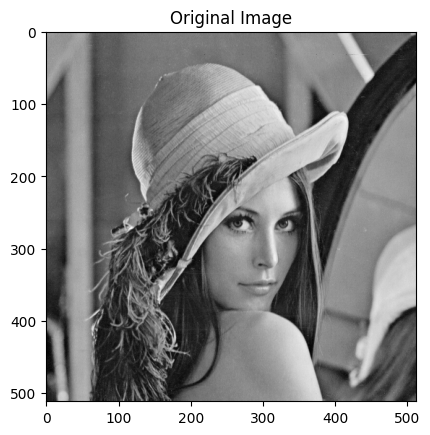

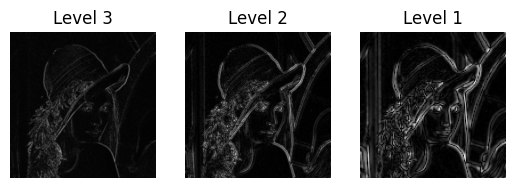

In [12]:
image = cv2.imread("/content/drive/MyDrive/Lenna_(test_image).png")
image = np.mean(image, axis=2)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.grid(False)
plt.show()

approx_pyramid = [image]
for i in range(2):
  # Downsample the last approximation image in the pyramid to half its size
  h, w = approx_pyramid[-1].shape[:2]
  downsampled = cv2.resize(approx_pyramid[-1], (w // 2, h // 2), interpolation=cv2.INTER_NEAREST)
  approx_pyramid.append(downsampled)

# Calculate the Gaussian pyramid of the image
gaussian_pyramid = [image]
levels = 3
for i in range(levels):
  lena_downsample = cv2.pyrDown(gaussian_pyramid[-1])
  gaussian_pyramid.append(lena_downsample)

# Calculate the prediction residual pyramid
residual_pyramid = []
for i in range(levels, 0, -1):
    # Upsample the image
    upsampled_img = cv2.pyrUp(gaussian_pyramid[i], dstsize=gaussian_pyramid[i-1].shape[1::-1])
    residual = cv2.subtract(gaussian_pyramid[i-1], upsampled_img)
    residual_pyramid.append(residual)

i = 0
l = levels
for r in (residual_pyramid[::-1]):
  r = np.abs(r)
  plt.subplot(1,levels, i+1)
  plt.imshow(r, cmap='gray')
  plt.title(f'Level {l}')
  plt.axis('off')
  l -= 1
  i += 1
plt.show()

# 5. Wavelet Transform
 For the grayscale Lena Image, compute the wavelet transform (with 3-level) using the Haar analysis filters.
Comment on the differences between the pyramids generated between this one and the previous question

(256, 256)


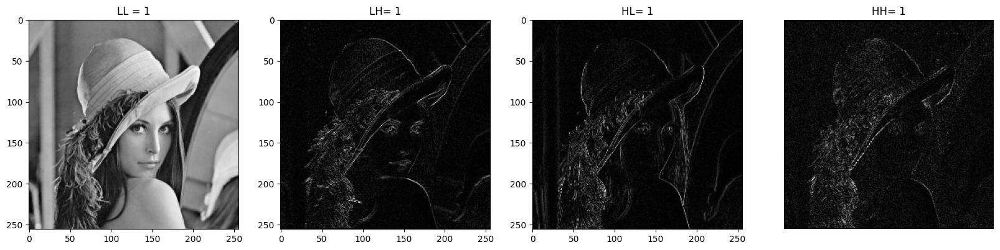

(128, 128)


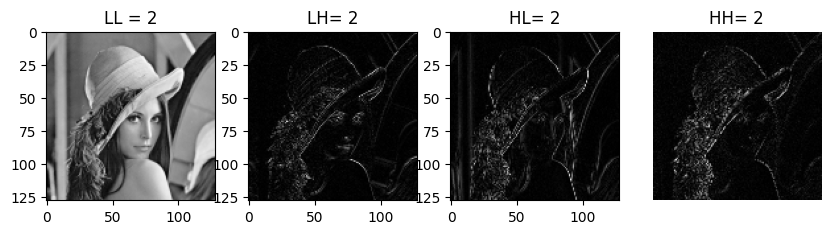

(64, 64)


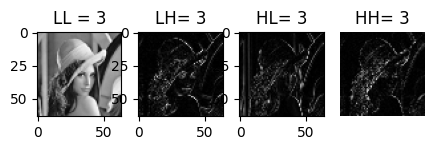

In [69]:
# Load the image
image = cv2.imread("/content/drive/MyDrive/Lenna_(test_image).png")
image = np.mean(image, axis=2)
aproximation = [image]
all_part = []


# Compute the wavelet transform
for i in range(3):
    coeffs = pywt.dwt2(aproximation[-1], 'haar')
    cA, (cH, cV, cD) = coeffs

    aproximation.append(cA)
    all_part.append((cA, cH, cV, cD))


for i in range(3):
  plt.figure(figsize=(20/pow(2,i),20/pow(2,i)))

  # Approximation
  plt.subplot(3, 4, 1 + (i*4))
  plt.imshow(all_part[i][0], cmap='gray')
  plt.title(f'LL = {i+1}')
  print(all_part[i][0].shape)

  # Horizontal Detail
  plt.subplot(3, 4, 2 + (i*4))
  plt.imshow(np.abs(all_part[i][1]), cmap='gray')
  plt.title(f'LH= {i+1}')

  # Vertical Detail
  plt.subplot(3, 4, 3 + (i*4))
  plt.imshow(np.abs(all_part[i][2]), cmap='gray')
  plt.title(f'HL= {i+1}')

  # Diagonal Detail
  plt.subplot(3, 4, 4 + (i*4))
  plt.imshow(np.abs(all_part[i][3]), cmap='gray')
  plt.title(f'HH= {i+1}')

  plt.axis('off')

  plt.show()

# 6. Scaling Transform using Bilinear and Nearest-Neighbor Interpolation 
Implement the scaling transform using Bilinear Interpolation and Nearest-Neighbor Interpolation and compare
the given results. (Lena image)

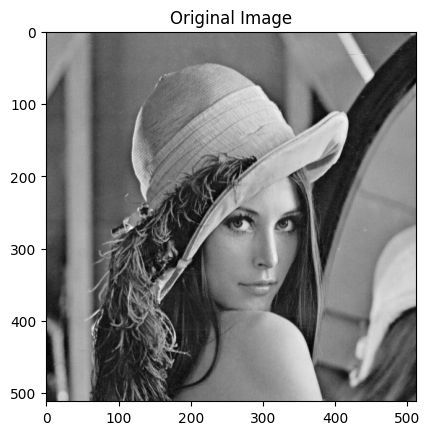

(512, 512)


<Figure size 640x480 with 0 Axes>

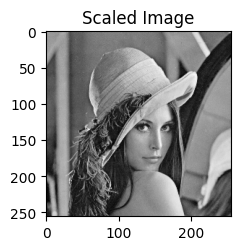

(512, 512)
SSIM for Nearest-Neighbor: 0.6519208671225432


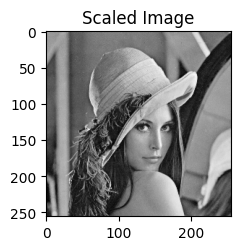

(256, 256)
SSIM for Bilinear Interpolation: 0.6519208671225432


In [81]:
import cv2
import numpy as np

# Read the input image and convert it to grayscale
image = cv2.imread("/content/drive/MyDrive/Lenna_(test_image).png")
image = np.mean(image, axis=2).astype(np.float32)

# Display the original image
plt.imshow(image, cmap='gray')

plt.title('Original Image')
plt.grid(False)
plt.show()
fh, fw = plt.figure().get_size_inches()
print(image.shape)

# Define the source and destination points with the correct shape and data type
pts1 = np.float32([[50,50],[200,50],[50,200]])

# define three points corresponding location to output image
pts2 = np.float32([[25,25],[100,25],[25,100]])

# get the affine transformation Matrix
M = cv2.getAffineTransform(pts1,pts2)

# apply affine transformation on the input image using Nearest-Neighbor
dst = cv2.warpAffine(image,M,(image.shape[0]//2,image.shape[1]//2), flags=cv2.INTER_NEAREST)
plt.figure(figsize=(fh/2, fw/2))
plt.imshow(dst, cmap='gray')
plt.title('Scaled Image')
plt.grid(False)
plt.show()
up_sampled  = cv2.resize(dst, (image.shape[0] , image.shape[1]))
print(up_sampled.shape)
print("SSIM for Nearest-Neighbor:", ssim(image, up_sampled))

# apply affine transformation on the input image using Bilinear Interpolation
dst = cv2.warpAffine(image,M,(image.shape[0]//2,image.shape[1]//2), flags=cv2.INTER_LINEAR)
plt.figure(figsize=(fh/2, fw/2))
plt.imshow(dst, cmap='gray')
plt.title('Scaled Image')
plt.grid(False)
plt.show()
print(dst.shape)
up_sampled  = cv2.resize(dst, (image.shape[0] , image.shape[1]))
print("SSIM for Bilinear Interpolation:", ssim(image, up_sampled))

